# Analysis of H3K27me3 scCTv2 (seq-nano) in adult human archival tissue
1 sample: 210803Mk1 (SD036/17-CSC)

In [1]:
import os
import csv
import scipy
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import episcanpy.api as epi
import magic
import scprep
from sklearn.feature_extraction.text import TfidfTransformer
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import style
import warnings
style.use("default")
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = "retina"
os.chdir("/data/proj/GCB_MK/CZI/episcanpy_analysis/AGG_ATAC_210218")

### Define functions

In [143]:
def runTFIDF(adata, run_norm=False):
    X = adata.X
    if run_norm:
        tfidf = TfidfTransformer(use_idf=True)
    else:
        tfidf = TfidfTransformer(use_idf=True, norm=False)
    X_norm = tfidf.fit_transform(X)
    adata.X = X_norm

def runLSI(adata, tf_idf=True, svd=True, removeFPC=False, 
           distance="cosine", umap=True, run_norm=False,
           n_pc=50, n_n=15, umap_comp=2, louvain=True):

    ## check binary
    if np.max(adata.X) > 1:
        adata.layers["raw_counts"] = adata.X.copy()
        epi.pp.binarize(adata)
        adata.layers["binary_counts"] = adata.X.copy()
    
    ## TF-IDF normalization    
    if tf_idf:
        runTFIDF(adata, run_norm)
    
    ## run SVD
    if svd:
        sc.tl.pca(adata, zero_center=False, n_comps=51)
    
    #remove first PC ((NOT RUN BY DEFAULT))
    if removeFPC:
        removefirstPC(adata)
    
    
    sc.pp.neighbors(adata, n_pcs=n_pc, n_neighbors=n_n, metric=distance)
    sc.tl.umap(adata, n_components=umap_comp)
    
    if louvain:
        epi.tl.louvain(adata)
    else:
        epi.tl.leiden(adata)



def extractPromoterCoord(gtf_file, window = 2000, feature_type = "gene", annotation = "HAVANA"):
    """
    If metagene=False, extracts all gene promoters. Otherwise, only extracts marker gene promoters.
    Returns dictionary indexed by chromosome
    """

    gtf = {}
    extnd = window//2
    with open(gtf_file) as f:
            for line in f:
                if line[0:2] != "##" and "\t"+feature_type+"\t" in line and "\t"+annotation+"\t" in line:
                    line = line.rstrip("\n").split("\t")
                    if line[6] == "+":
                        if line[0] not in gtf.keys():
                            gtf[line[0]] = [[int(line[3])-extnd, int(line[3])+extnd, line[-1].split(";")[:-1]]]
                        else:
                            gtf[line[0]].append([int(line[3])-extnd, int(line[3])+extnd, line[-1].split(";")[:-1]])
                    else:
                        if line[0] not in gtf.keys():
                            gtf[line[0]] = [[int(line[4])-extnd, int(line[4])+extnd, line[-1].split(";")[:-1]]]
                        else:
                            gtf[line[0]].append([int(line[4])-extnd, int(line[4])+extnd, line[-1].split(";")[:-1]])
    return gtf


def extractGeneAnnot(gtf_file, upstream = 2000, feature_type = "gene", annotation = "HAVANA"):
    """
    get coordinates and annotations of genes from a GTF file. Returns dictionary indexed by chromosome
    """
    gtf = {}
    
    with open(gtf_file) as f:
        for line in f:
            if line[0:2] != "##" and "\t"+feature_type+"\t" in line and "\t"+annotation+"\t" in line:
                line = line.rstrip("\n").split("\t")
                if line[6] == "+":
                    if line[0] not in gtf.keys():
                        gtf[line[0]] = [[int(line[3])-upstream, int(line[4]), line[-1].split(";")[:-1]]]
                    else:
                        gtf[line[0]].append([int(line[3])-upstream, int(line[4]), line[-1].split(";")[:-1]])
                else:
                    if line[0] not in gtf.keys():
                        gtf[line[0]] = [[int(line[3]), int(line[4])+upstream, line[-1].split(";")[:-1]]]
                    else:
                        gtf[line[0]].append([int(line[3]), int(line[4])+upstream, line[-1].split(";")[:-1]])
    return gtf

def extractFeatureCoordinates(adata):
    """
    get coordinates of features from AnnData object.
    """

    raw_adata = adata.copy()
    raw_adata_features = {}
    feature_index = 0
    for line in raw_adata.var_names.tolist():
        line = line.split('_')
        if line[0] not in raw_adata_features.keys():
            raw_adata_features[line[0]] = [[int(line[1]),int(line[2]), feature_index]]
        else:
            raw_adata_features[line[0]].append([int(line[1]),int(line[2]), feature_index])
        feature_index += 1
    return raw_adata_features

def buildGeneActivityMatrix(adata, raw_adata_features, gtf, feature_type="gene"):
    """
    find the features overlaping the genes and build the count matrix
    """

    gene_index = []
    gene_activity_X = []
    raw_adata = adata.copy()
    for chrom in gtf.keys():
        if chrom in raw_adata_features.keys():
            #print(chrom)
            chrom_index = 0
            previous_features_index = 0
            for gene in gtf[chrom]:
                gene_values = []
                gene_start = gene[0]
                gene_end = gene[1]
                for feature in raw_adata_features[chrom]:
                    feature_index = 0
                    if (feature[1]<= gene_start): # the window is before the gene. we need to test the next window.
                        continue
                    elif (gene_end <= feature[0]): # the window is after the gene. we need totest the next gene.
                        break
                    else: # the window is overlapping the gene.
                        gene_values.append(raw_adata.X[:,feature[2]].todense())
                if gene_values != []:
                    gene_activity_X.append(np.sum(gene_values, axis=0))
                    gene_index.append(gene[-1])
    gene_activity_X = np.concatenate(tuple(gene_activity_X), axis=-1)

    # get the variable metadata
    if feature_type=='transcript':
        gene_name = [x[7].lstrip(' transcript_name "').rstrip('"') for x in gene_index]
    else:
        gene_name = [x[2].lstrip(' gene_name "').rstrip('"') for x in gene_index]
    metadata_genes = {'gene_id' : [],
                      'transcript_id' : [],
                      'gene_type' : [],
                      'gene_name' : [],
                      'transcript_type' : [],
                      'transcript_name' : [],
                      'protein_id' : []}
    for line in gene_index:
        dico_line = {}
        for element in line:
            if ' "' in element:
                dico_line[element.rstrip('"').lstrip(" ").split(' "')[0]] = element.rstrip('"').lstrip(" ").split(' "')[1]

        for key in metadata_genes.keys():
            if key in dico_line.keys():
                metadata_genes[key].append(dico_line[key])
            else:
                metadata_genes[key].append('NA')
    dataframe_genes = pd.DataFrame.from_dict(metadata_genes)
    dataframe_genes.index = gene_name

    #adata.layers[layer_name] = ad.AnnData(gene_activity_X, var=dataframe_genes, obs=raw_adata.obs)
    gene_adata = ad.AnnData(gene_activity_X, var=dataframe_genes, obs=raw_adata.obs)
    gene_adata.uns = adata.uns.copy()
    gene_adata.obsm = adata.obsm.copy()
    gene_adata.obsp = adata.obsp.copy()
    return(gene_adata)

def extractMarkerGenes(rna_adata, n_genes = 100):
    """
    take in RNA-seq anndata object and give dictionary of marker genes per cluster
    marker genes are selected by logfold change
    """
    #if rna_adata.var_names != rna_adata.var["gene_names"]:
    rna_adata.var_names = rna_adata.var["gene_names"]

    if not "rank_genes_groups" in rna_adata.uns.keys():
        #from scanpy.tl import rank_genes_groups
        sc.tl.rank_genes_groups(rna_adata, groupby = "clusters_named")

    result = rna_adata.uns["rank_genes_groups"]
    groups = result['names'].dtype.names
    marker_genes = {}
    for group in groups:
        marker_genes[group] =pd.DataFrame(
            {key: result[key][group]
             for key in ["names", "logfoldchanges"]}).head(n_genes).sort_values(by=["logfoldchanges"], ascending=False)["names"].tolist()
    return marker_genes

def addMetageneScores(adata, gene_modules, n_markers=10):
    """
    adata should be a GENE_ACTIVITY object -> Output from build_gene_activity_matrix.py
    assigns a metagene celltype score to each cell. score is the sum of the reads in the marker genes for each celltype.
    gene_modules should be a dict: {"OPC": ["SOX10", "PDGFRA", "PTPRZ1"], "ASTRO": ["AQP4", "GFAP"]}
    """

    if "index" not in adata.var.keys():
        adata.var["index"] = [i for i in range(0,len(adata.var))]

    max_markers = min([len(gene_modules[k]) for k in gene_modules.keys()])
    n_markers = max_markers if n_markers > max_markers else n_markers

    celltype_marker_index = {}
    for module in gene_modules.keys():
        celltype_marker_index[module] = []
        for gene in gene_modules[module]:
            if gene in adata.var["gene_name"]:
                celltype_marker_index[module].append(adata.var.loc[adata.var["gene_name"] == gene, "index"].iloc[0])

        adata.obs[module+"_score"] = np.sum(adata.X[:,celltype_marker_index[module]], axis=1)

## Read in object and pre-process

In [3]:
#annot = epi.ct.load_features("ref/2kb_binned_hg38.bed")
#annot = epi.ct.load_features("../../../scCT/CZI_2021/10kb_binned_hg38.bed")
#adata = epi.ct.bld_mtx_fly(tsv_file = "/proj/tmp/mukund/ct/P22551_1019_v2/outs/frags.tsv.gz",
#                            csv_file = "/proj/tmp/mukund/ct/P22551_1019_v2/outs/singlecell_EPI.csv",
#                            annotation = annot, save="/data/proj/GCB_MK/CZI/episcanpy_analysis/210915_scCTv2_human_macs_10kbpeaks.h5ad")

adata = ad.read("../210915_scCTv2_human_macs_10kbpeaks.h5ad")

adata.layers["raw_counts"] = adata.X.copy()
epi.pp.binarize(adata)
adata.layers["binary_counts"] = adata.X.copy()
epi.pp.filter_cells(adata, min_features=1)
epi.pp.filter_features(adata, min_cells=1)
adata.obs["log_nb_features"] = [np.log10(x) for x in adata.obs["nb_features"]]

In [5]:
#adata = ad.read("../210915_scCTv2_human_macs_10kbpeaks.h5ad")

adata.layers["raw_counts"] = adata.X.copy()
epi.pp.binarize(adata)
adata.layers["binary_counts"] = adata.X.copy()
epi.pp.filter_cells(adata, min_features=1)
epi.pp.filter_features(adata, min_cells=1)
adata.obs["log_nb_features"] = [np.log10(x) for x in adata.obs["nb_features"]]
adata

AnnData object with n_obs × n_vars = 3117 × 283188
    obs: 'nb_features', 'log_nb_features'
    var: 'n_cells'
    layers: 'raw_counts', 'binary_counts'

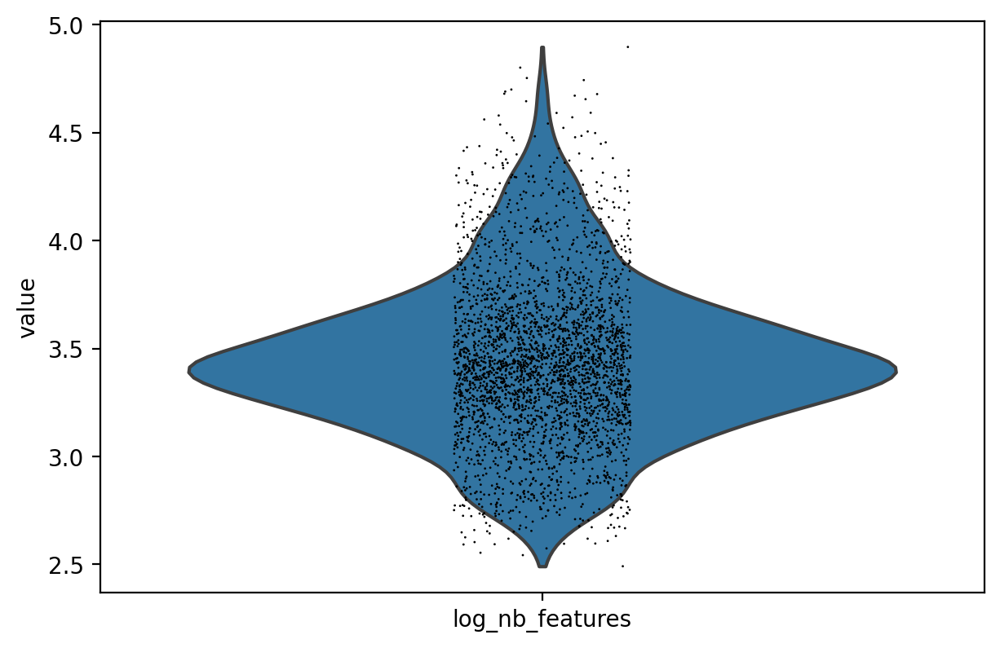

In [6]:
epi.pl.violin(adata, "log_nb_features")

## Run LSI

In [9]:
adata.X = adata.layers["binary_counts"].copy()
runLSI(adata, louvain=False) 
epi.tl.leiden(adata, resolution=2, key_added = "leiden_2.0")

In [12]:
adata.layers["normalized_counts"] = adata.X.copy()

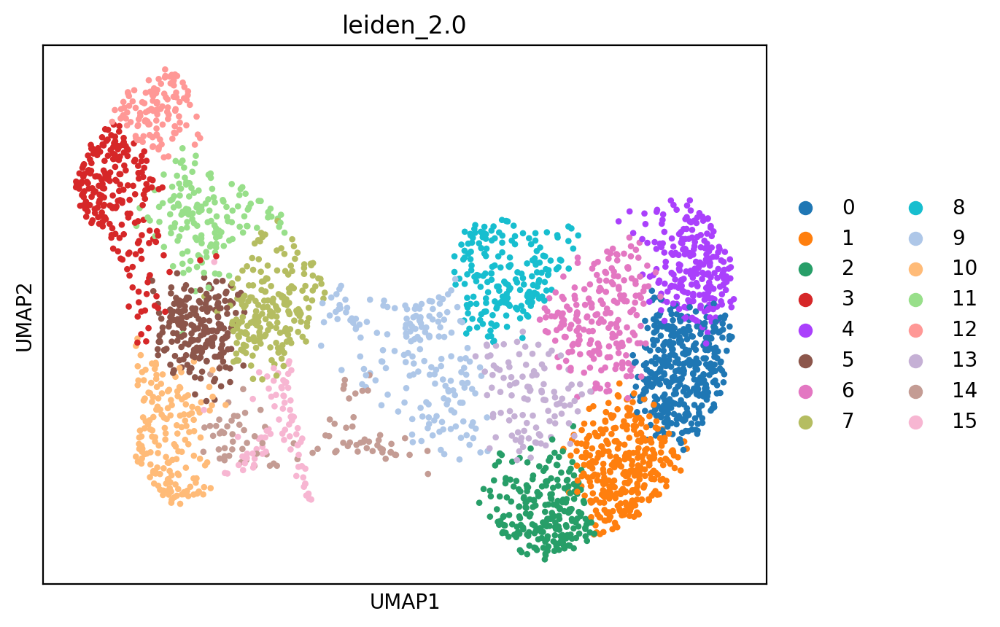

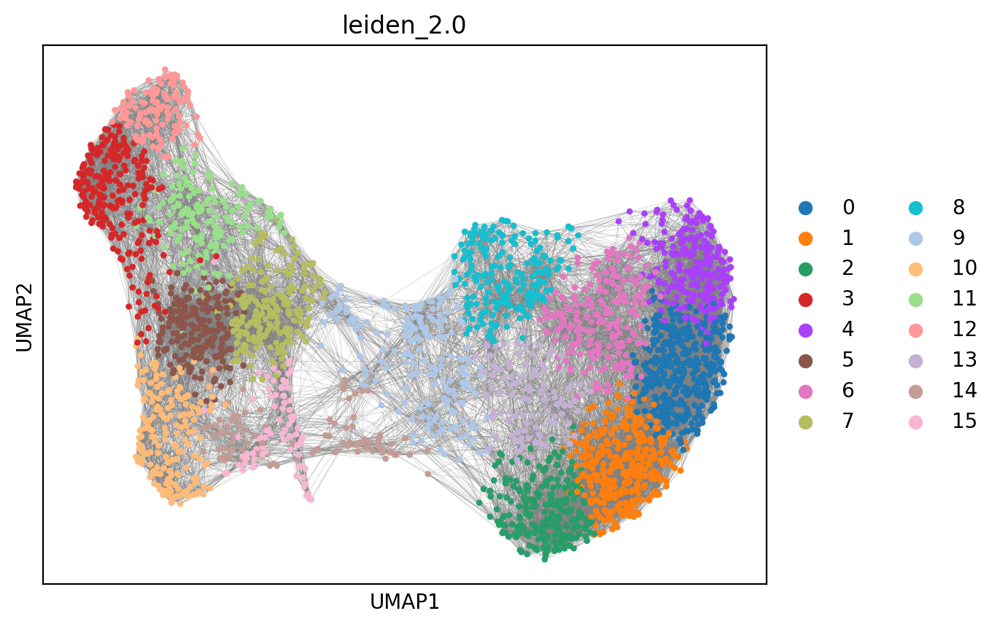

In [149]:
epi.pl.umap(adata, color=["leiden_2.0"])
epi.pl.umap(adata, color="leiden_2.0", edges=True)
# leiden_2.0 --> resolution = 2.0

### Extract cluster barcodes to call cluster specific peaks later

In [41]:
bc_cluster_df = adata.obs[["barcode","leiden_2.0"]]
bc_cluster_df.to_csv("../211103_scCT_barcodes_by_leiden2.0_cluster_LSI-1.csv", header=False, index=False)

## View marker features for each cluster 

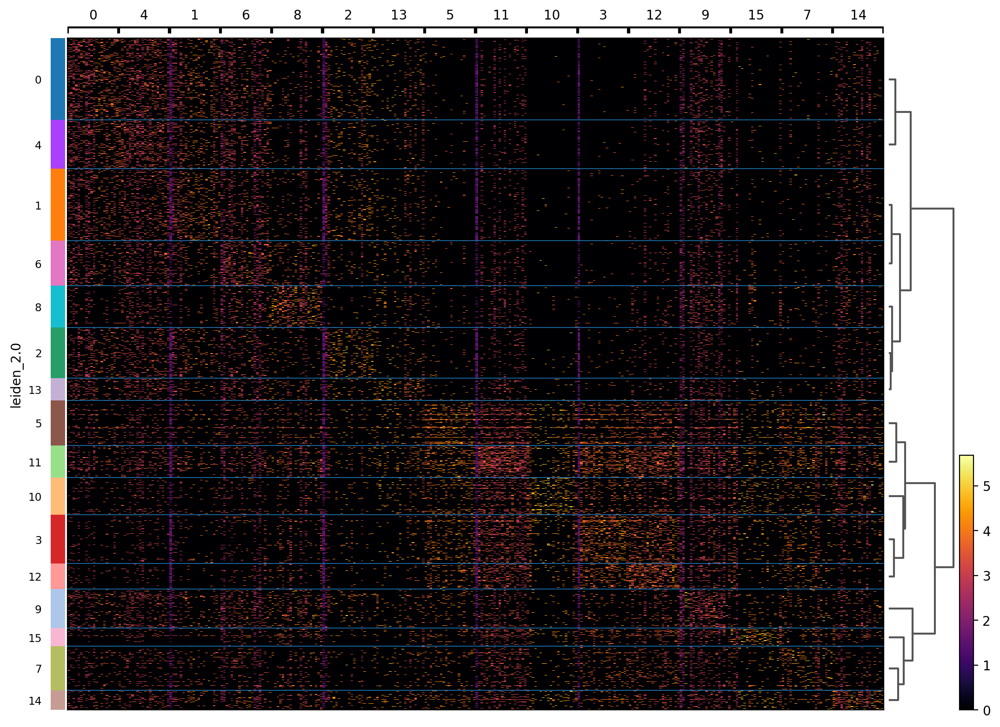

In [26]:
epi.tl.rank_features(adata, groupby="leiden_2.0")
sc.pl.rank_genes_groups_heatmap(adata, key="rank_features_groups", figsize=(12.8,9.6), n_genes=20)

In [27]:
epi.tl.find_genes(adata,
           gtf_file='ref/gencode.v35.annotation.gtf',
           key_added='transcript_annotation',
           upstream=2000,
           feature_type='transcript',
           annotation='HAVANA',
           raw=False)

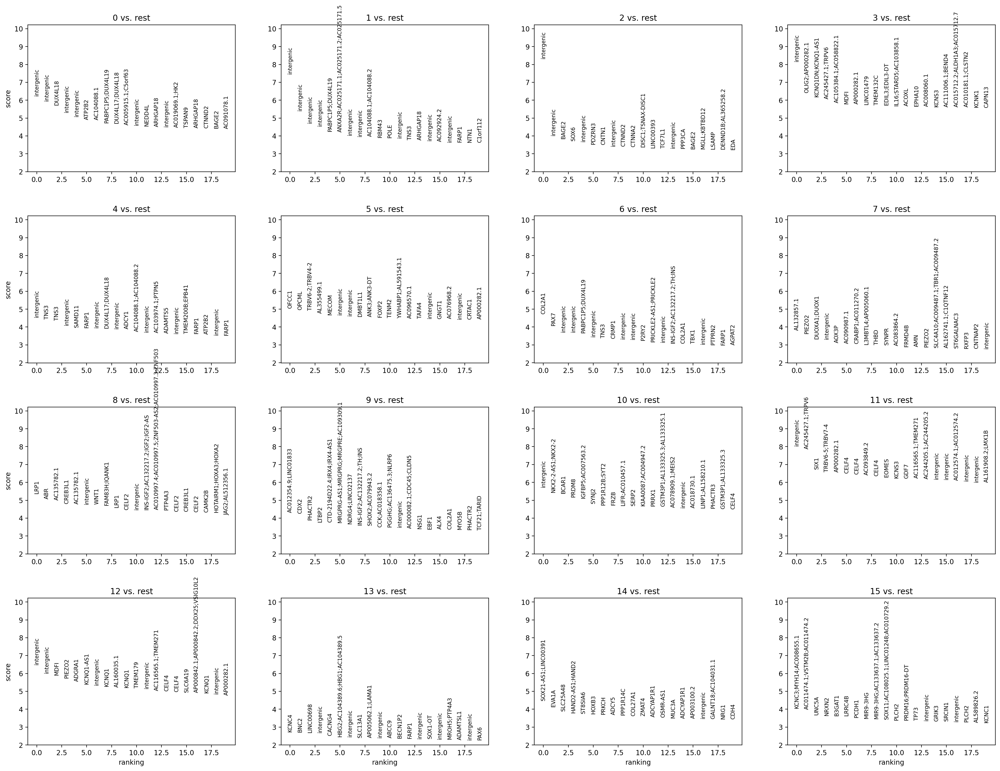

In [28]:
epi.pl.rank_feat_groups(adata, feature_symbols='transcript_annotation')

## Build the Gene Activity Matrix

In [55]:
gtf = extractPromoterCoord(gtf_file="ref/gencode.v35.annotation.gtf", window = 5000)
adata_features = extractFeatureCoordinates(adata)
adata.X = adata.layers["raw_counts"].copy()
gene_adata = buildGeneActivityMatrix(adata=adata, gtf=gtf, raw_adata_features=adata_features, feature_type="gene")
gene_adata.write("../211103_scCT_GA_matrix_from10kbmtx.h5ad")

In [56]:
rna = ad.read("data/feature_matrices/HCA_RNA_all_annot.h5ad")
gene_modules  = extractMarkerGenes(rna_adata = rna)
addMetageneScores(adata=gene_adata, gene_modules=gene_modules)

In [57]:
gene_adata

AnnData object with n_obs × n_vars = 3117 × 51917
    obs: 'nb_features', 'log_nb_features', 'leiden', 'leiden_2.0', 'barcode', 'Oligo_score', 'Neuron_RELN+_1_score', 'Astrocyte_1_score', 'Microglia-Macrophages_1_score', 'Endothelial-Pericyte_1_score', 'Endothelial-Pericyte_2_score', 'OPC_score', 'Microglia-Macrophages_2_score', 'Neuron_In_1_score', 'Neuron_RELN+_2_score', 'Neuron_In_2_score', 'Neuron_Ex_1_score', 'Neuron_Ex_2_score', 'Neuron_RELN+_3_score', 'Astrocyte_2_score', 'Neuron_In_3_score', 'Immune_score', 'Neuron_Ex_3_score', 'Stromal_1_score', 'Stromal_2_score', 'Astrocyte_3_score', 'Neuron_In_4_score', 'Astrocyte_4_score'
    var: 'gene_id', 'transcript_id', 'gene_type', 'gene_name', 'transcript_type', 'transcript_name', 'protein_id', 'index'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_features_groups', 'dendrogram_leiden', 'leiden_2.0_colors', 'dendrogram_leiden_2.0'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

In [118]:
gene_list = []
for k in gene_modules.keys():
    for g in gene_modules[k]:
        gene_list.append(g)
gene_list = list(set(gene_list))

gene_list = [x for x in gene_list if x in gene_adata.var_names]
ctypes = ["Oligo_score","OPC_score", "Microglia-Macrophages_1_score", "Astrocyte_1_score", "Neuron_Ex_1_score", "Neuron_RELN+_1_score"]

## Impute using MAGIC

In [119]:
magic_op = magic.MAGIC(t=3)
gene_adata_magic = magic_op.fit_transform(gene_adata, genes=gene_list)

Calculating MAGIC...
  Running MAGIC on 3117 cells and 51917 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 2.66 seconds.
    Calculating KNN search...
    Calculated KNN search in 1.00 seconds.
    Calculating affinities...
    Calculated affinities in 0.99 seconds.
  Calculated graph and diffusion operator in 4.67 seconds.
  Calculating imputation...
  Calculated imputation in 0.20 seconds.
Calculated MAGIC in 6.69 seconds.


In [120]:
gene_adata_magic.X = scipy.sparse.csr_matrix(gene_adata_magic.X)
gene_adata_magic.obsm = gene_adata.obsm.copy()
gene_adata_magic.obsp = gene_adata.obsp.copy()

In [121]:
gene_adata_magic

AnnData object with n_obs × n_vars = 3117 × 1360
    obs: 'nb_features', 'log_nb_features', 'leiden', 'leiden_2.0', 'barcode', 'Oligo_score', 'Neuron_RELN+_1_score', 'Astrocyte_1_score', 'Microglia-Macrophages_1_score', 'Endothelial-Pericyte_1_score', 'Endothelial-Pericyte_2_score', 'OPC_score', 'Microglia-Macrophages_2_score', 'Neuron_In_1_score', 'Neuron_RELN+_2_score', 'Neuron_In_2_score', 'Neuron_Ex_1_score', 'Neuron_Ex_2_score', 'Neuron_RELN+_3_score', 'Astrocyte_2_score', 'Neuron_In_3_score', 'Immune_score', 'Neuron_Ex_3_score', 'Stromal_1_score', 'Stromal_2_score', 'Astrocyte_3_score', 'Neuron_In_4_score', 'Astrocyte_4_score'
    var: 'gene_id', 'transcript_id', 'gene_type', 'gene_name', 'transcript_type', 'transcript_name', 'protein_id', 'index'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

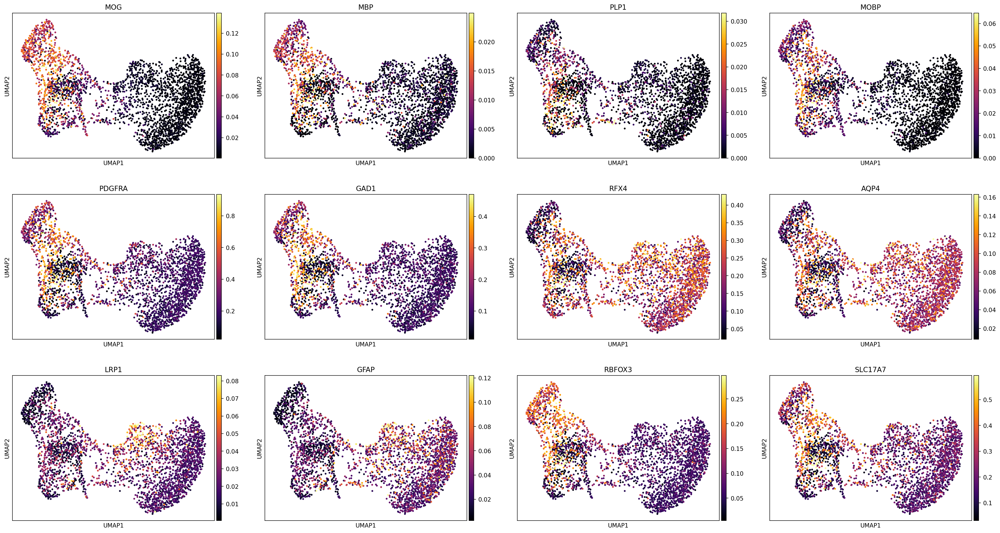

In [151]:
markers = ['MOG','MBP','PLP1','MOBP','PDGFRA','GAD1','RFX4','AQP4','LRP1','GFAP','RBFOX3','SLC17A7']
epi.pl.umap(gene_adata_magic, color=markers, ncols=4, vmax="p99")

## Re-assign Metagene scores on imputed matrix

In [138]:
gene_adata_magic.var["index"] ## old index list. Remove and let addMetageneScores add it back properly
addMetageneScores(adata=gene_adata_magic, gene_modules=gene_modules)

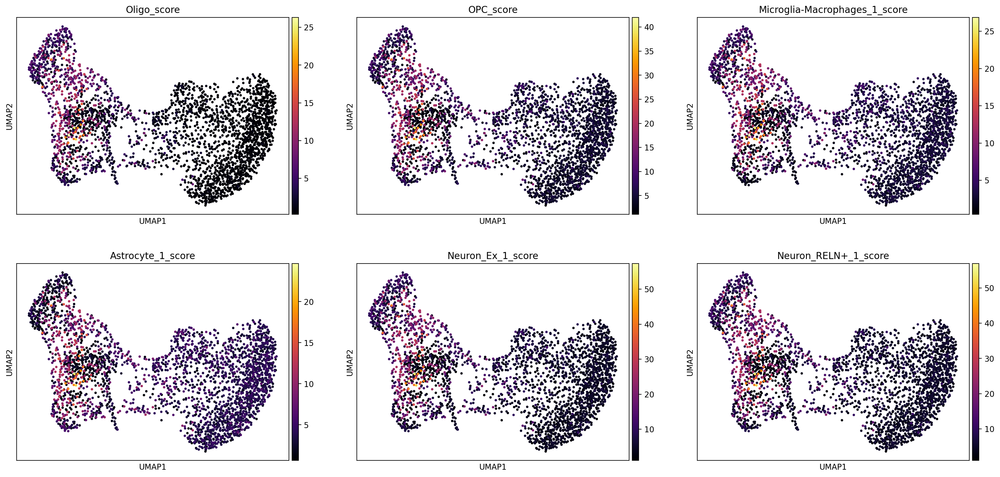

In [152]:
epi.pl.umap(gene_adata_magic, color=ctypes, ncols=3)

In [153]:
adata.write("../211103_scCTv2_human_macs_10kbpeaks_RESULTS.h5ad")
gene_adata.write("../211103_scCT_v2_GA_matrix_RESULTS.h5ad")
gene_adata_magic.write("../211103_scCT_v2_magic_GA_matrix_RESULTS.h5ad")